## Mathematical Optimization Series

# Part 4: General steepest descent

In this post we describe several variations of normalized gradient descent, known generally as  *steepest descent* algoritms.  These variations arise out of a small but fundamental change to the gradient descent setup, a change that has significant impact on the form of a descent direction but, importantly, not on the convergence of the methods (steepest descent methods converge under the same general condition as gradient descent i.e., that the length of the steps eventually diminishes).

Because normalized gradient approaches have the benefit of being able to push through flat regions of a non-convex function (as we saw earlier in this series), many popular optimizers for deep neural networks are built on the basic methods presented here - in particular the $L_{\infty}$ steepest descent step (for example the Resilient Backpropagation algorithm, or [Rprop](https://en.wikipedia.org/wiki/Rprop) as well as its variations like Root Mean Square Propagation or [RMSprop](https://en.wikipedia.org/wiki/Stochastic_gradient_descent#RMSProp)).

In [2]:
# imports from custom library
import sys
sys.path.append('../../')
import matplotlib.pyplot as plt
from mlrefined_libraries import basics_library as baslib
from mlrefined_libraries import calculus_library as callib
from mlrefined_libraries import math_optimization_library as optlib
from mlrefined_libraries import linear_algebra_library as linlib
import autograd.numpy as np
import time

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

# 1.  Generalized Steepest descent

When we first discussed gradient descent the descent direction given by the negative gradient fell out naturally from a geometric understanding of hyperplanes.  Here we begin our discussion of steepest descent algorithms by re-visiting gradient descent and deriving the descent direction using a more rigorous mathematical framework.  This framework immediately suggests a way to generalize the gradient descent algorithm under various different *norms*, which we then explore.

## 1.1  Steepest descent direction in the $L_2$ norm

When first deriving the gradient descent direction of a multi-input function $g(\mathbf{w})$ at a point $\mathbf{v}$ we began by examining the tangent hyperplane to $g$ at this point

\begin{equation}
h\left(\mathbf{w}^{\,}\right)=g\left(\mathbf{v}\right)+\nabla g\left(\mathbf{v}\right)^{T}\left(\mathbf{w}-\mathbf{v}\right)
\end{equation}

We then reasoned out that since in general we know that the *ascent* direction on a hyperplane is given by its set of 'slopes' - here $\nabla g(\mathbf{v})$ -  that intuitively therefore the descent direction is given by the negative gradient as $-\nabla g(\mathbf{v})$ or normalized to unit length as $-\frac{\nabla g(\mathbf{v})}{\left\Vert \nabla g(\mathbf{v}) \right\Vert_2 }$.  We often used the latter unit-normalized version since after all we care only about the descent *direction*.

This descent direction can be derived more formally as follows.  Note that $\mathbf{d} = \mathbf{w} - \mathbf{v}$ is a general search direction centered at the point $\mathbf{v}$.  We want to find the unit-length direction $\mathbf{d}$ that provides the smallest evaluation on the hyperplane: i.e., that gives the smallest value $g(\mathbf{v}) + \nabla g(\mathbf{v})^T(\mathbf{w} - \mathbf{v}) = g(\mathbf{v}) + \nabla g(\mathbf{v})^T\mathbf{d}$.  Since $\mathbf{d}$ is only present in the second term we only need care about finding the unit length direction $\mathbf{d}$ so that $\nabla g(\mathbf{v})^T\mathbf{d}$ is as small as possible.

Formally this is a simple constrained minimization problem

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{minimize}} & \nabla g(\mathbf{v})^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{2}=1\\
\end{array}
\end{equation}

Using the toy in the next Python cell we explore possible solutions to this problem in two dimensions for a particular choice of gradient vector, gaining valuable geometric intuition as to what the solution should be.  There we plot an example gradient vector $\nabla g (\mathbf{v})$ as a red arrow, along with the $L_2$ unit ball. Moving the slider from left to right you can test various directions $\mathbf{d}$ (each shown as a black arrow) on this $L_2$ unit ball computing the inner product $\nabla g(\mathbf{v})^{T}\mathbf{d}$, whose value is simultaneously plotted in the right panel.  As you move the slider right the direction providing the *smallest* value is shown as a green arrow in the left panel, and is highlighted in green in the plot in the right panel.  


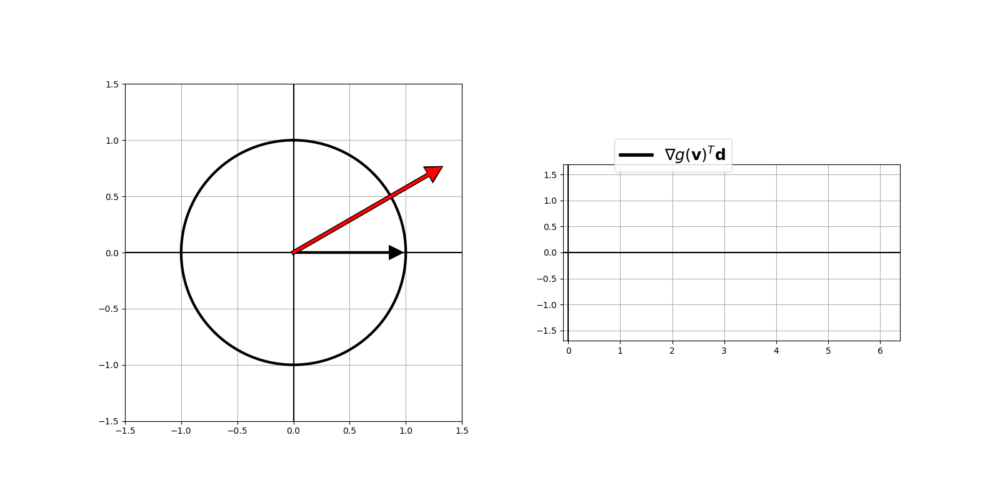
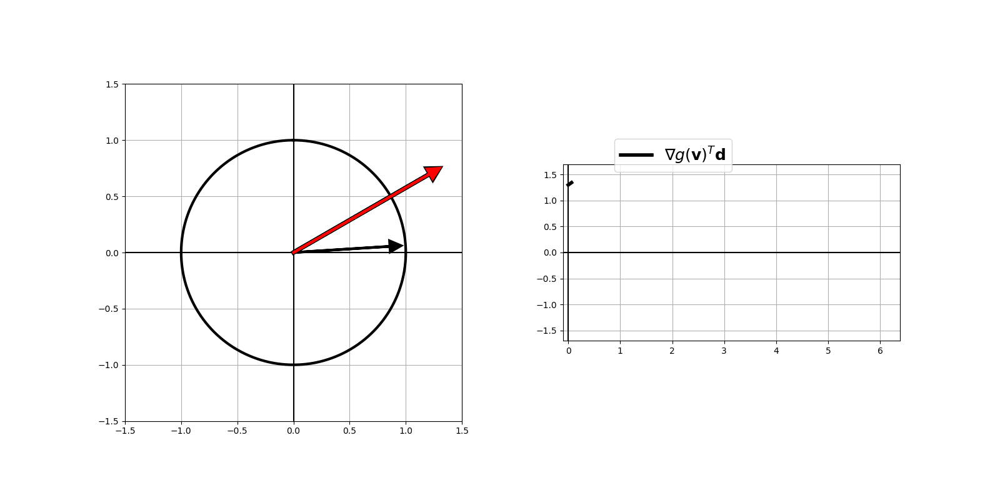
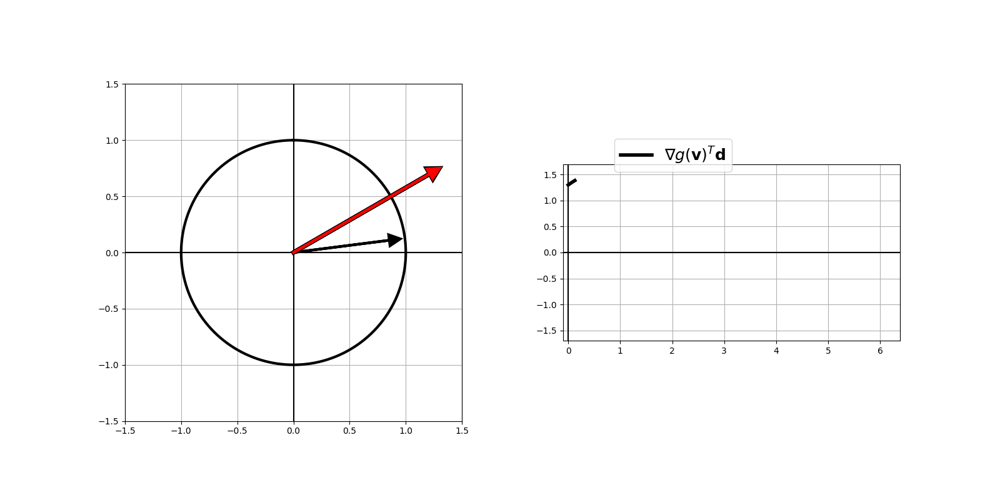
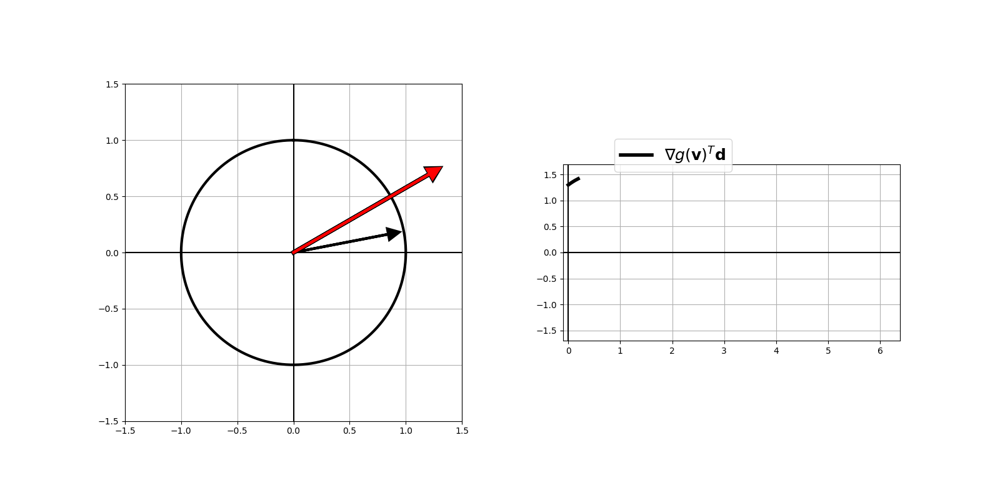
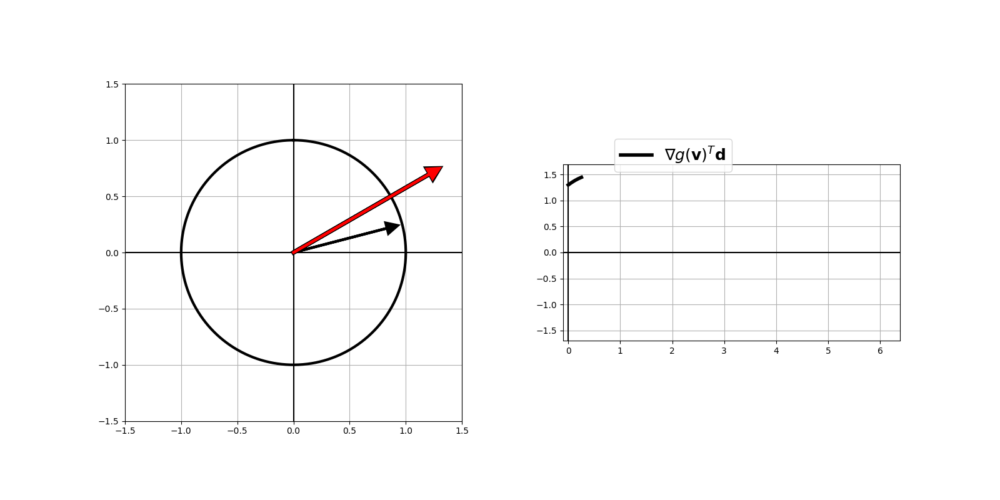
...
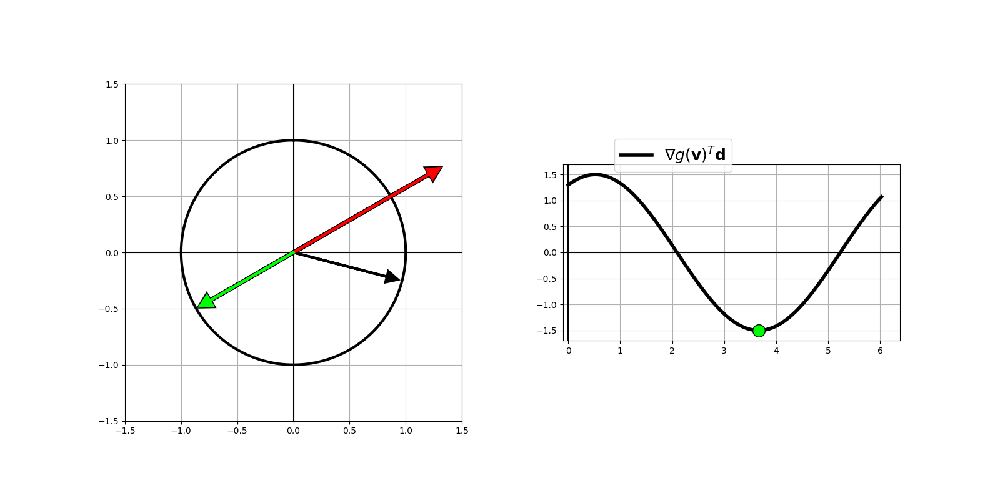
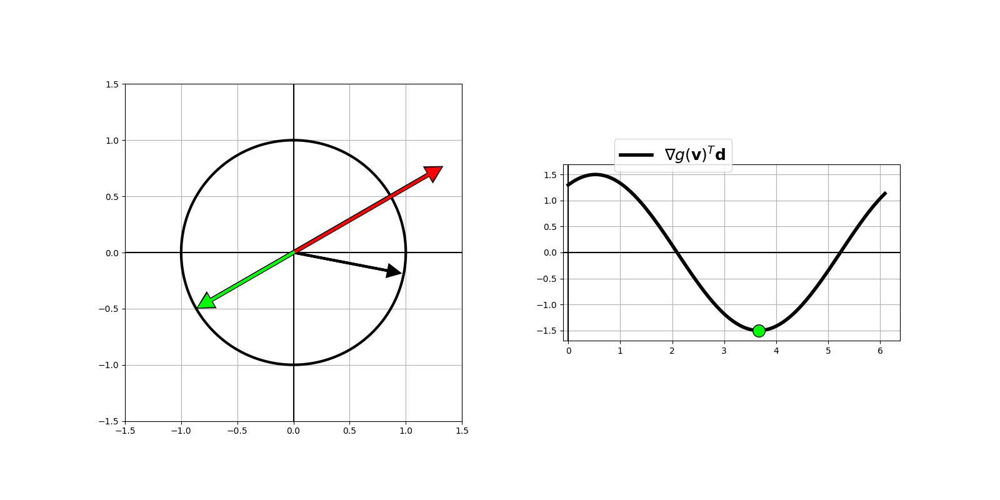
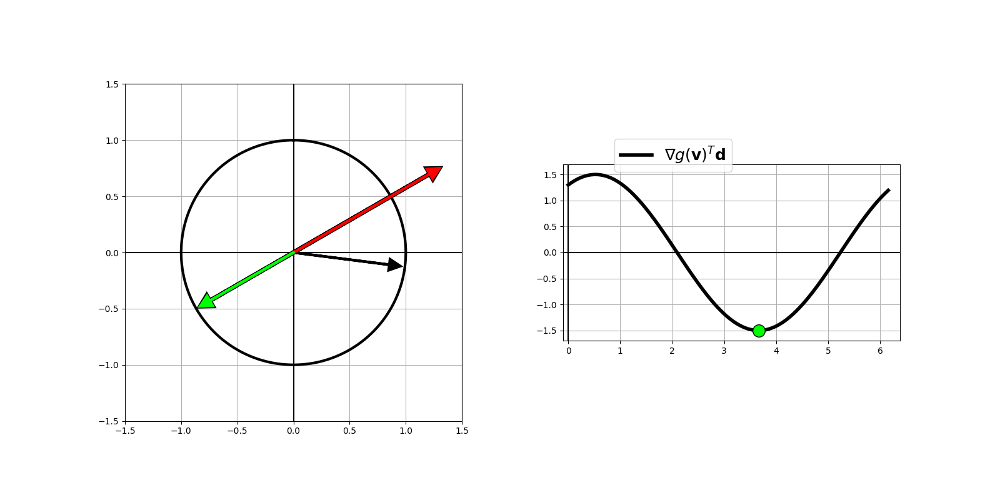
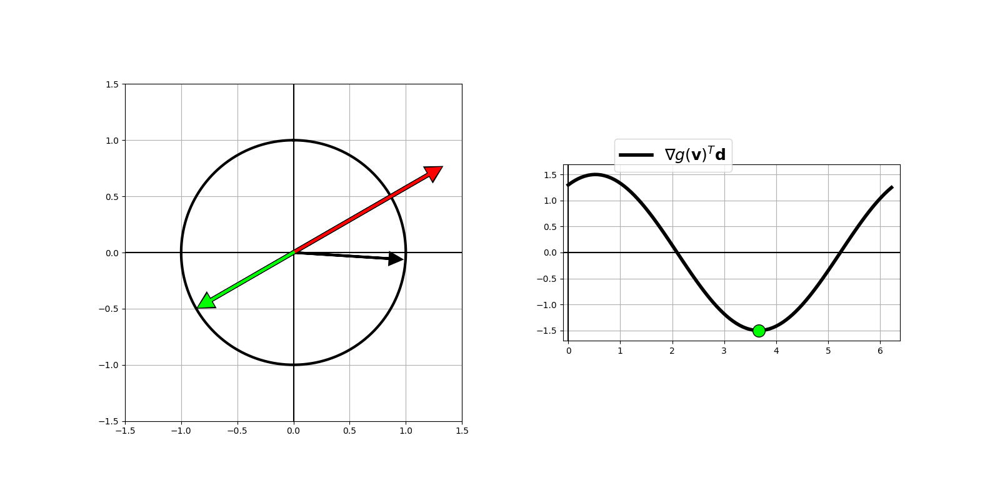
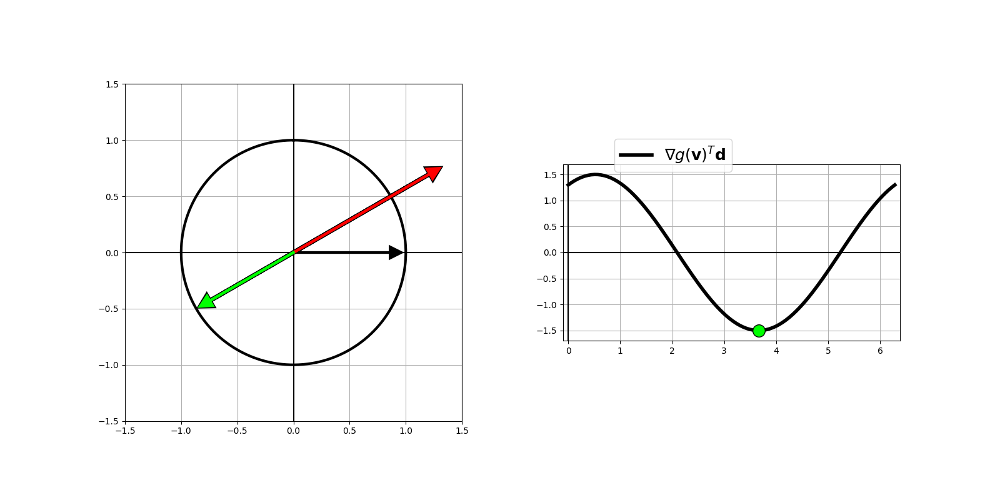

In [92]:
# create an animation showing the origin of the sine and cosine functions
num_frames = 100
pt = [1.3,0.75]
optlib.steepest_descent_direction.L2(pt,num_frames)

As we can be seen it appears as if indeed $\mathbf{d} = -\frac{\nabla g(\mathbf{v})}{\left\Vert \nabla g(\mathbf{v}) \right\Vert_2 }$ is the direction producing the smallest inner product.

To prove this formally we can use the *inner product rule* which tells us almost immediately what the solution to this problem is.  Since for any two vectors it says that $\mathbf{a}^T \mathbf{b}^{\,} = \left \Vert \mathbf{d} \right \Vert_2 \left \Vert \mathbf{d} \right \Vert_2 \text{cos}(\theta)$ where $\theta$ is the angle between the two vectors, the value of $\mathbf{a}^T \mathbf{d}^{\,}$ is smallest when the two vectors point in *opposite* directions, i.e., $\mathbf{d} = -\mathbf{a}$.  When this happens $\theta = \pi$ and since $\text{cos}(\pi) = -1$ we have  $\mathbf{a}^T \left(-\mathbf{a}^{\,}\right) = \left \Vert \mathbf{a} \right \Vert_2 \left \Vert \mathbf{a} \right \Vert_2 \text{cos}(\pi) = -\left \Vert \mathbf{a} \right \Vert_2^2$.  If $\mathbf{b}$ must also be unit length it then follows that $-\frac{\mathbf{a}}{\left \Vert \mathbf{a} \right \Vert}$.  Thus setting $\mathbf{a} = \nabla g(\mathbf{v}$ we have solution to the above problem: $\mathbf{d} = \frac{\nabla g(\mathbf{v}}{\left \Vert \nabla g(\mathbf{v}) \right \Vert}$ i.e., the normalized gradient descent direction.

In deriving the gradient descent direction in this way it is referred to more generally as a *steepest descent direction*.

## 1.2  Steepest descent direction in the $L_1$ norm

With this setup we can actually choose any norm in the constraint that we wish to determine a descent direction.  For example replacing the $L_2$ with the $L_1$ norm we have a similar looking problem whose solution defines a new steepest descent direction

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{minimize}} & \nabla g(\mathbf{v})^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{1}=1\\
\end{array}
\end{equation}

with respect to the $L_1$ norm.  The direction we find here will certainly be different than the $L_2$ constrained version.

Using the toy in the next Python cell we explore possible solutions to this problem in two dimensions for a particular choice of gradient vector, gaining valuable geometric intuition as to what the solution should be.  There we plot an example gradient vector $\nabla g (\mathbf{v})$ as a red arrow, along with the $L_1$ unit ball. Moving the slider from left to right you can test various directions $\mathbf{d}$ (each shown as a black arrow) on this $L_1$ unit ball computing the inner product $\nabla g(\mathbf{v})^{T}\mathbf{d}$, whose value is simultaneously plotted in the right panel.  As you move the slider right the direction providing the *smallest* value is shown as a green arrow in the left panel, and is highlighted in green in the plot in the right panel.  


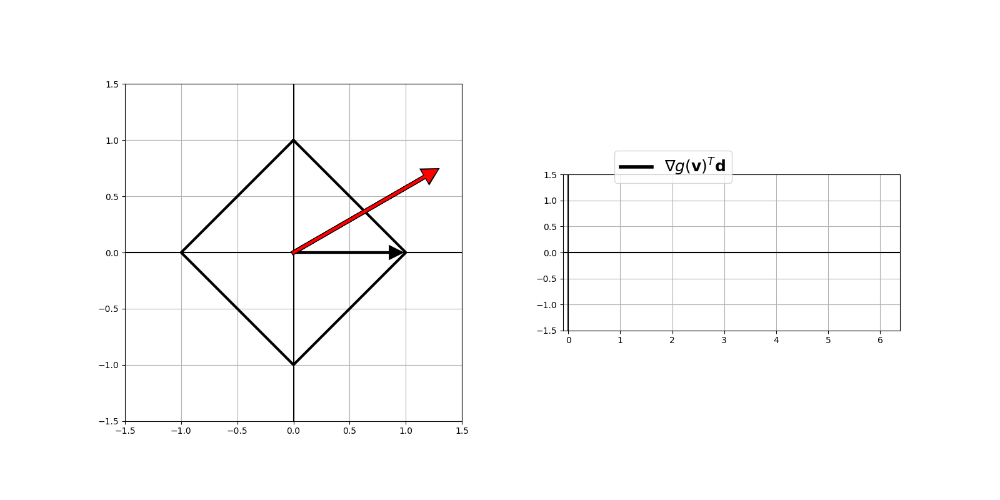
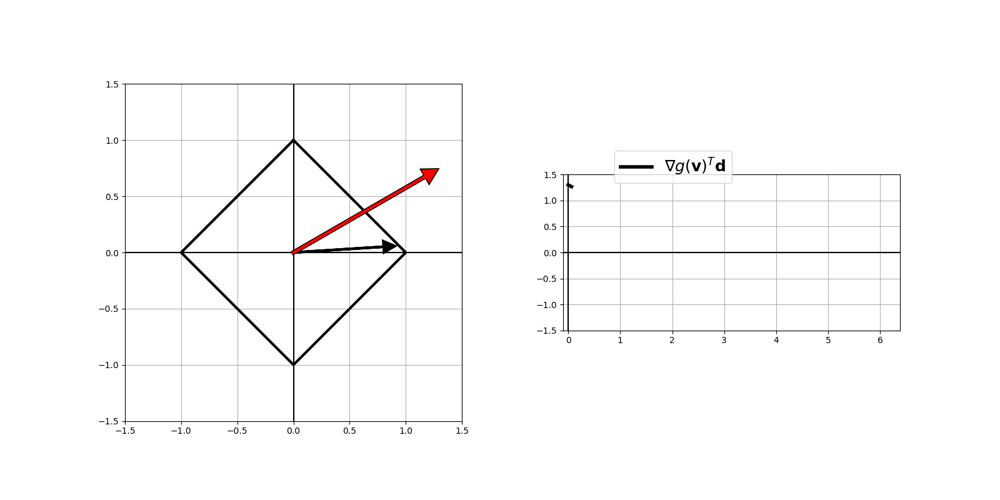
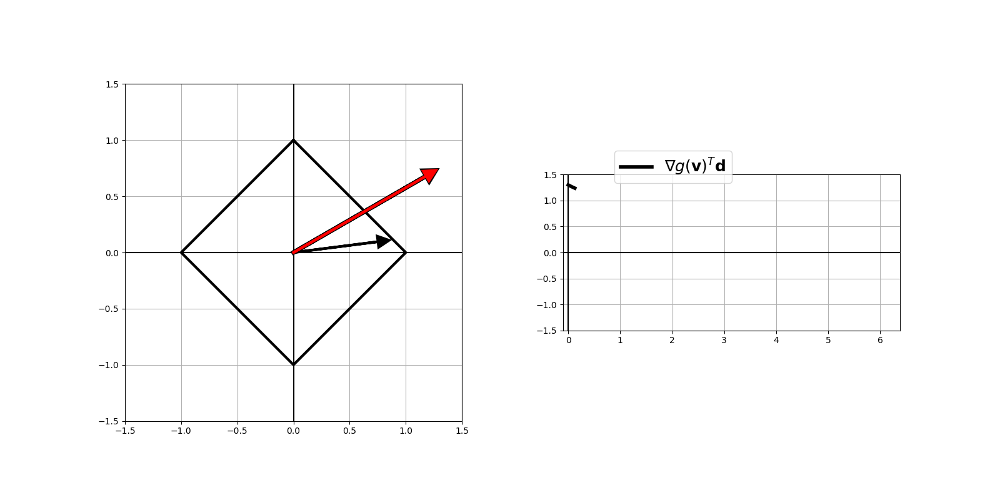
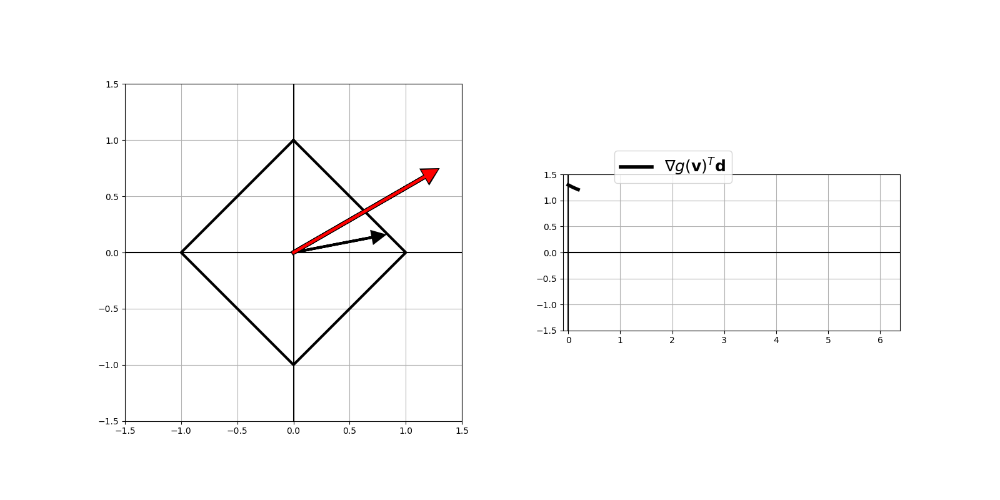
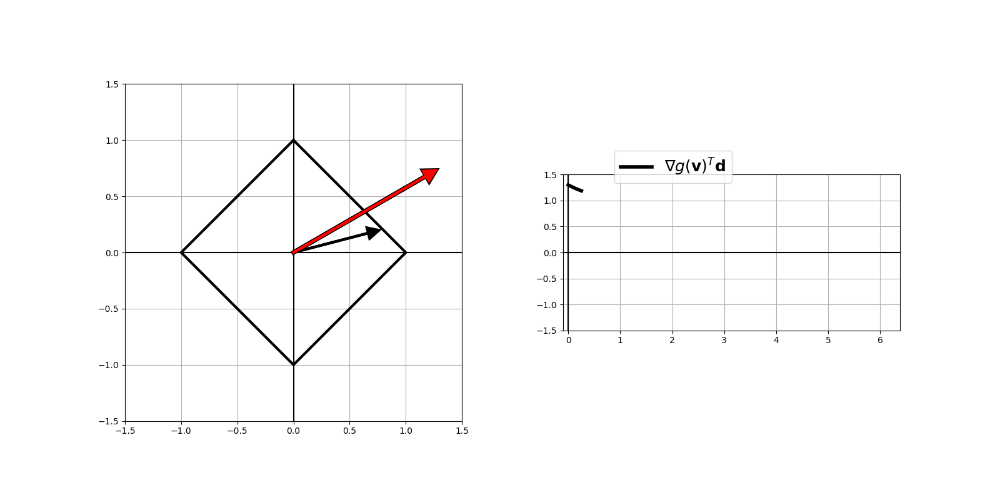
...
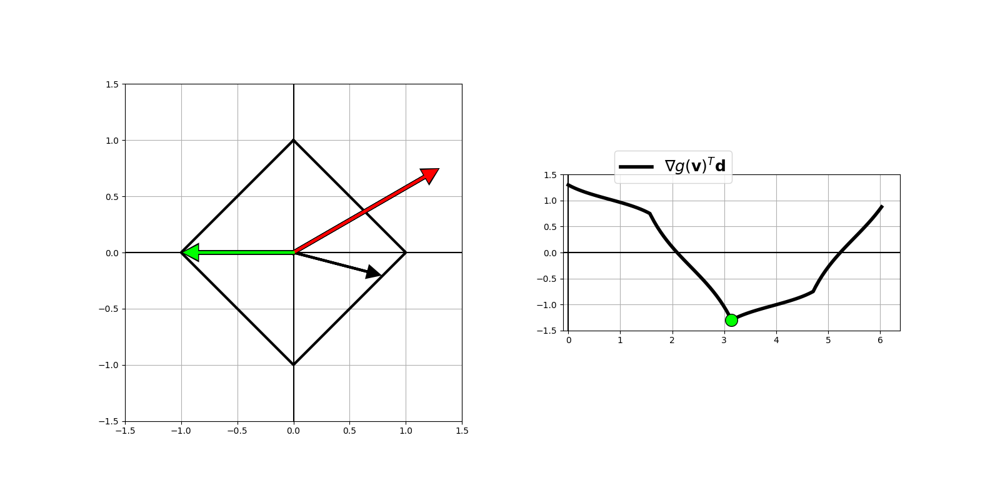
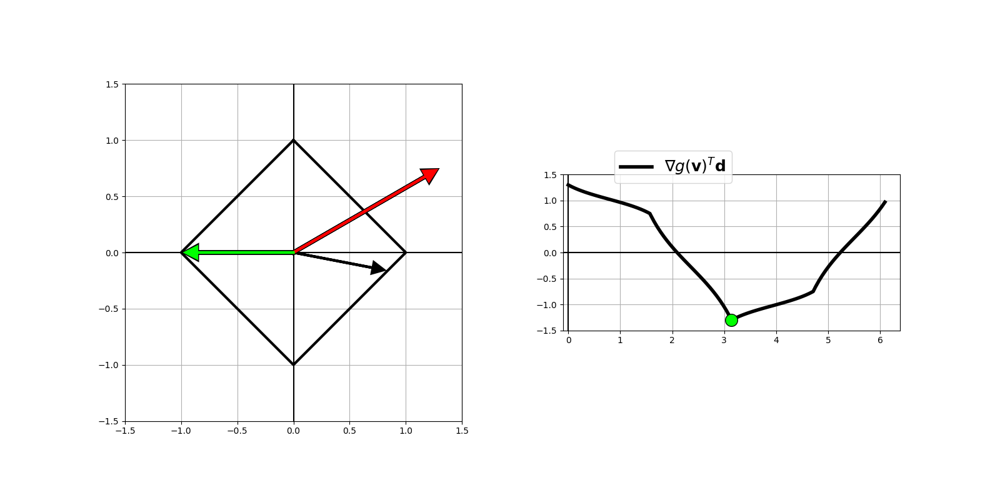
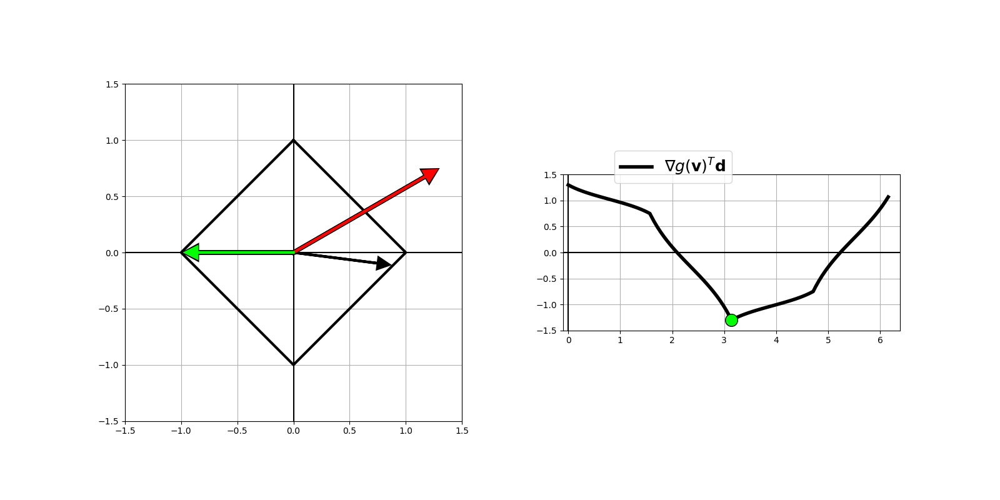
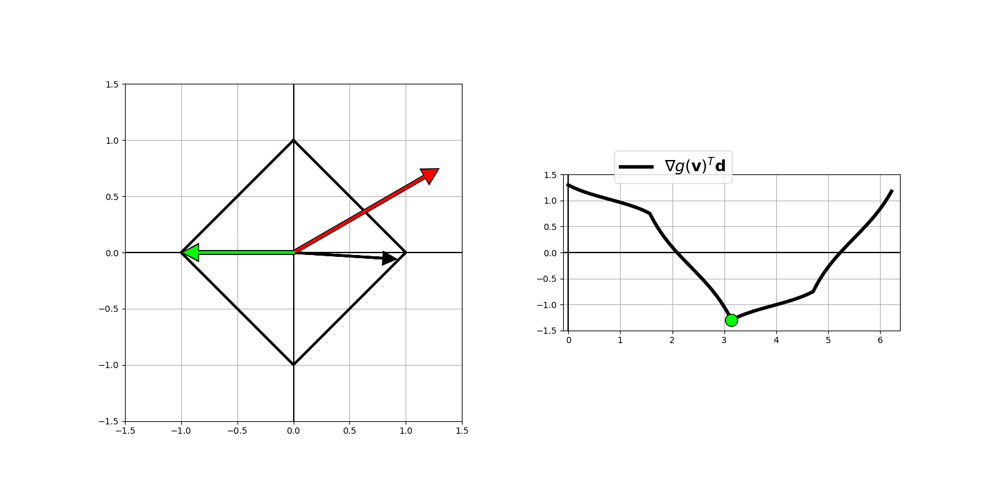
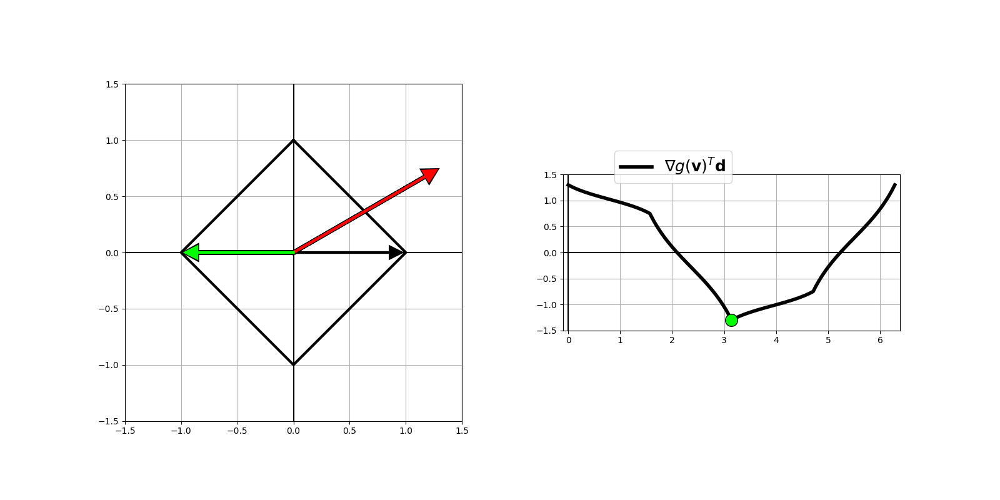

In [91]:
# create an animation showing the origin of the sine and cosine functions
num_frames = 100
pt = [1.3,0.75]
optlib.steepest_descent_direction.L1(pt,num_frames)

Toying around with the slider above it looks as if the descent direction here is defined along a *coordinate axis* as the negative direction of only the largest (in magnitude) partial derivative of the gradient.  Mathematically this is 

$$
\mathbf{d} = - \,\underset{j=1,2}{\text{maximum}}\frac{ \frac{\partial}{\partial w_j}g(\mathbf{v}) }{{\left \Vert \frac{\partial}{\partial w_j}g(\mathbf{v}) \right \Vert_2}}  \mathbf{e}_j
$$

where $\mathbf{e}_j$ is a standard basis vector with a $1$ in its $j^{th}$ position and zeros elsewhere.  Since $\frac{ \frac{\partial}{\partial w_j}g(\mathbf{v}) }{{\left \Vert \frac{\partial}{\partial w_j}g(\mathbf{v}) \right \Vert_2}} = \text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{v})\right)\in \{-1,0,1\}$ the above can be written more compactly as $\mathbf{d} = - \,\underset{j=1,2}{\text{maximum}} \,\,\text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{v})\right)^{\,} \mathbf{e}_j^{\,}$.

It is certainly possible for more than one partial derivative to be maximal (in magnitude) (e.g., in the above demonstration this happens when the gradient is set to $\begin{bmatrix} 1 \\ 1 \end{bmatrix}$), so more generally speaking if we denote $\mathcal{S}$ the set of indices of those maximal partial derivatives the direction here appear to be 

\begin{equation}
\mathbf{d} = - \sum_{j \in \mathcal{S} } \,\,\text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{v})\right)^{\,} \mathbf{e}_j^{\,}.
\end{equation}

This formula can be proven to be true rigorously, as we show in the Appendix Section of this post.

The steepest descent step at $\mathbf{w}^{k-1}$ in this direction looks like

\begin{equation}
\mathbf{w}^{k} = \mathbf{w}^{k-1} - \alpha \sum_{j \in \mathcal{S} } \,\,\text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{w}^{k-1})\right)^{\,} \mathbf{e}_j^{\,}
\end{equation}

where the index set $\mathcal{S}$ changes from step to step depending on the full gradient $\nabla g\left(\mathbf{w}^{k-1} \right)$.  Given how each direction is formed these steps tend to go along the coordinate directions, like a *coordinate descent* approach.  This descent step appears less useful then the $L_2$ analog in general, since we must still compute the entire gradient in order to use it and then we 'throw away' all but its largest values.  

#### <span style="color:#a50e3e;">Example 1. </span>  $L_1$ steepest descent applied to minimizing a quadratic

In the next Python cell we use the $L_1$ steepest descent approach to find the minimum of 

\begin{equation}
g\left(w_1,w_2 \right) = 0.26\left(w_1^2 + w_2^2\right) - 0.48w_1w_2
\end{equation}

located at the origin.  We draw the path taken by this approach directly on the function contours - which are colored green as the method starts and gradually change red as it halts.

<IPython.core.display.Javascript object>


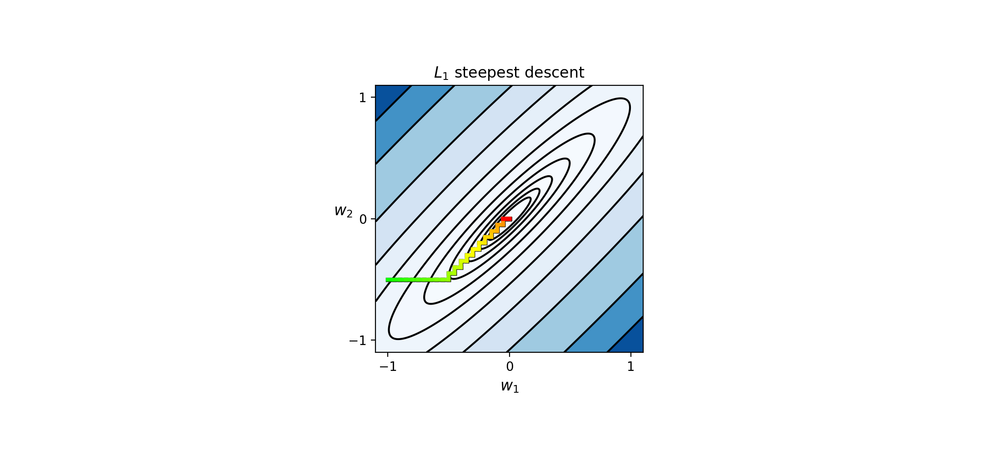

In [47]:
# the Rastrigin function
g = lambda w: 0.26*(w[0]**2 + w[1]**2) - 0.48*w[0]*w[1]

# run the visualizer for our chosen input function, initial point, and step length alpha
demo = optlib.steepest_descent.visualizer();
w_init = [-1,-0.5]; max_its = 40; steplength = 0.05;

demo.L1(g,w_init,steplength,max_its,num_contours = 30,linewidth = 3,xmin = -1.1, xmax = 1.1, ymin = -1.1, ymax = 1.1)

## 1.3  Steepest descent direction in the $L_{\infty}$ norm

Replacing the $L_2$ norm in equation (2) with the $L_{\infty}$ norm we have a similar looking problem whose solution defines a new kind of steepest descent direction

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{minimize}} & \nabla g(\mathbf{v})^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{\infty}=1\\
\end{array}
\end{equation}

Using the toy in the next Python cell we explore possible solutions to this problem in two dimensions for a particular choice of gradient vector, gaining valuable geometric intuition as to what the solution should be.  Here once again we plot an example gradient vector $\nabla g (\mathbf{v})$ as a red arrow, along with the $L_{\infty}$ unit ball. Moving the slider from left to right you can test various directions $\mathbf{d}$ (each shown as a black arrow) on this $L_{\infty}$ unit ball computing the inner product $\nabla g(\mathbf{v})^{T}\mathbf{d}$, whose value is simultaneously plotted in the right panel.  As you move the slider right once more the direction providing the *smallest* value is shown as a green arrow in the left panel, and is highlighted in green in the plot in the right panel.  


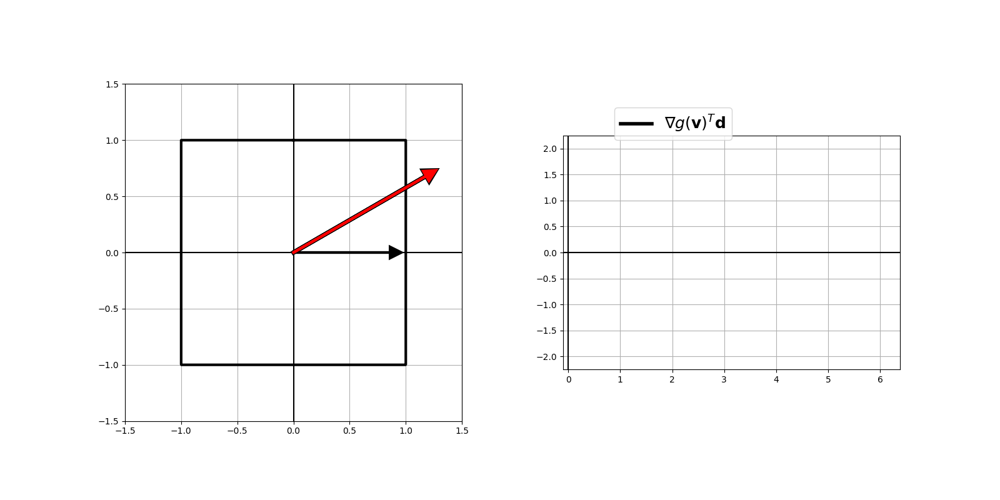
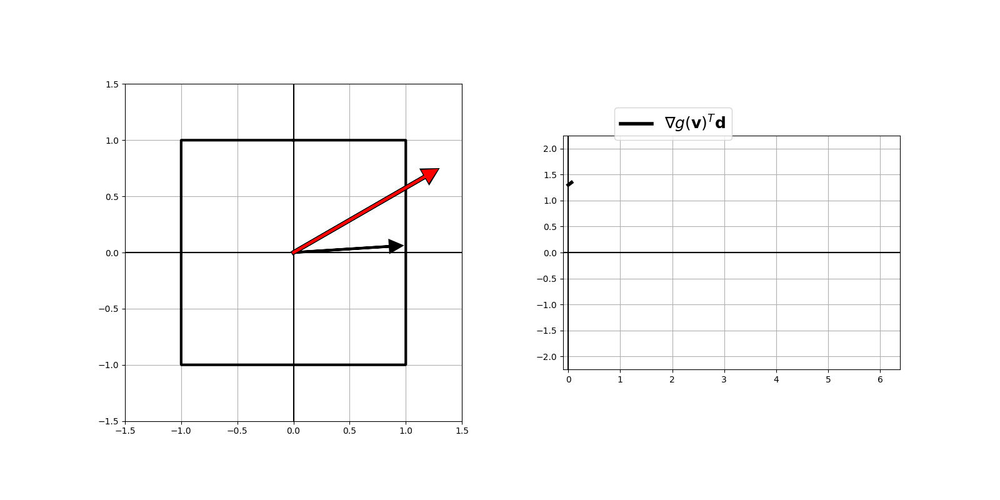
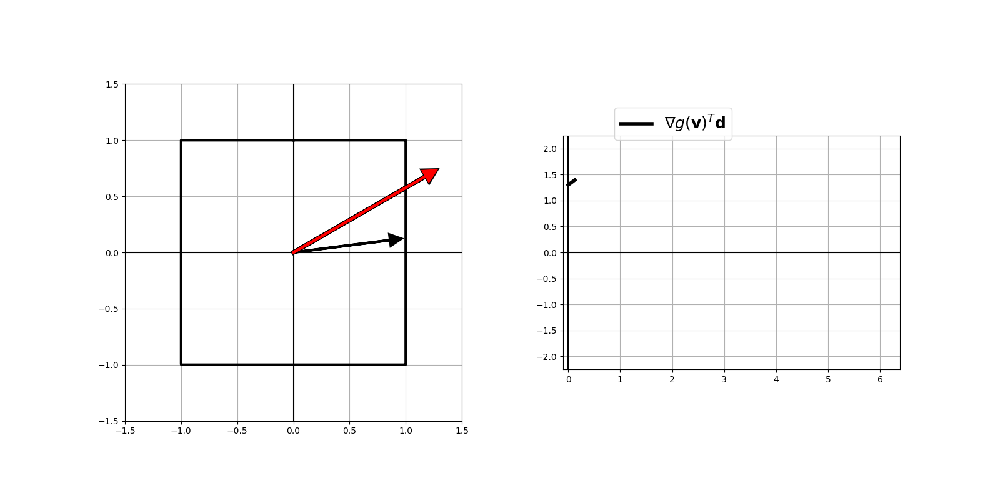
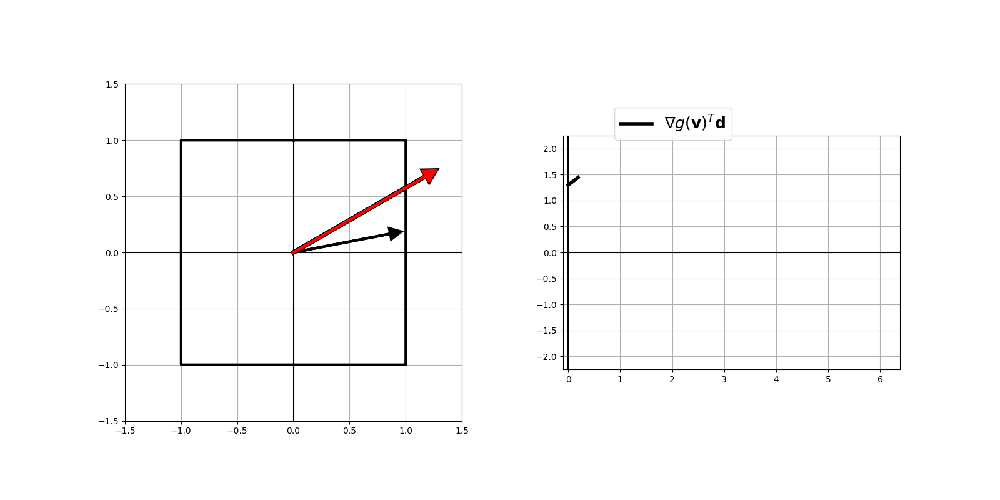
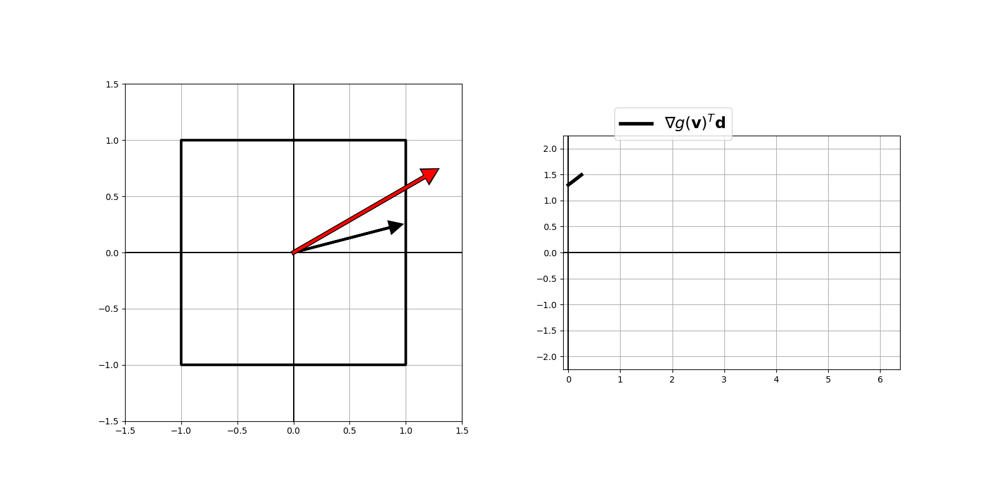
...
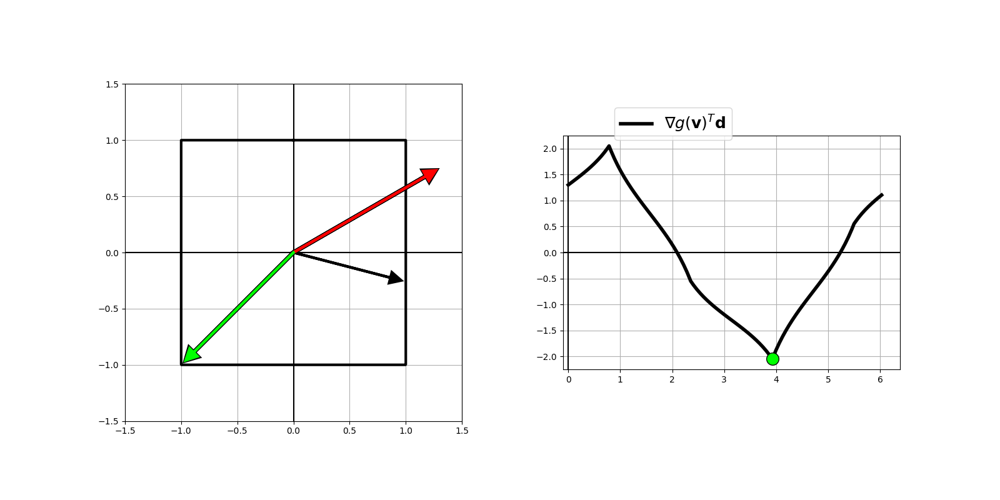
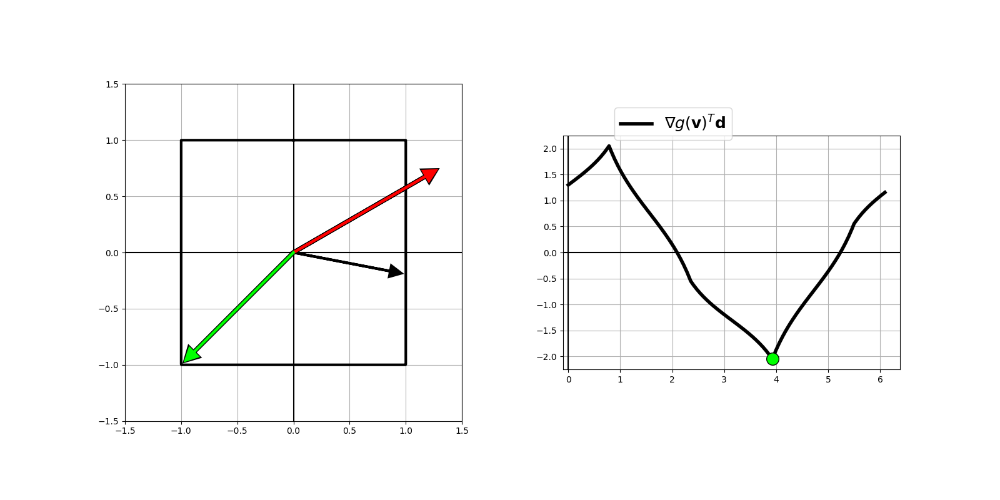
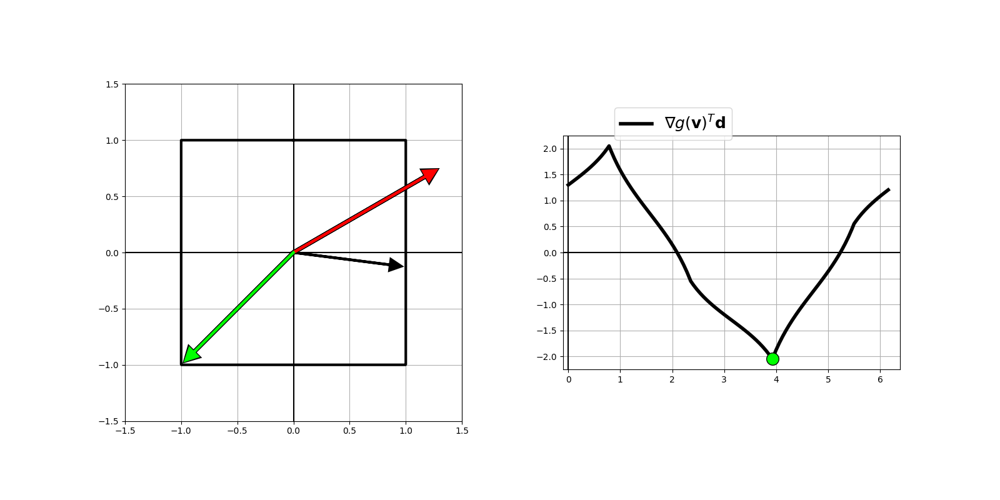
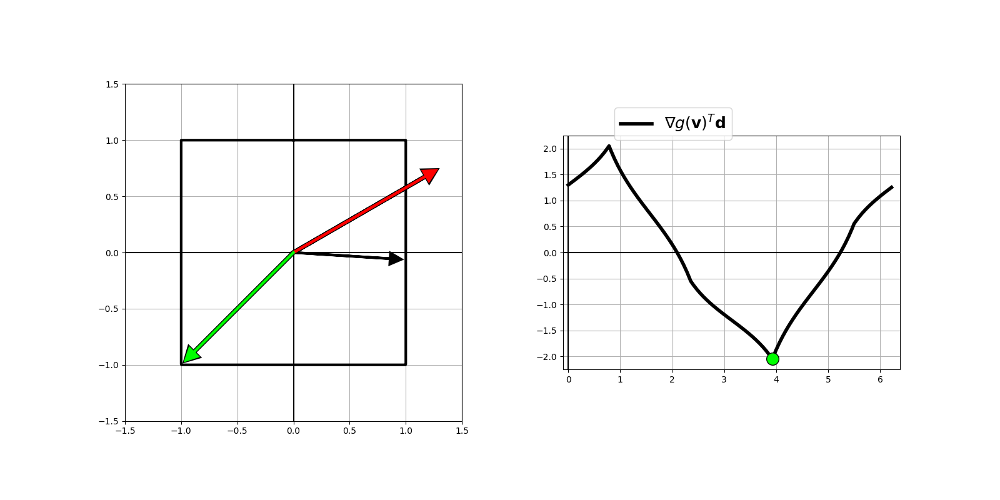
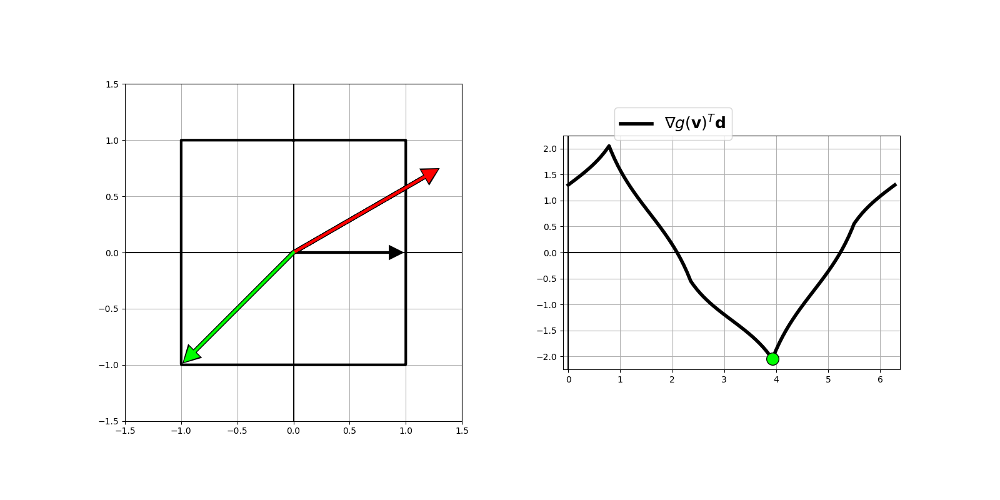

In [90]:
# create an animation showing the origin of the sine and cosine functions
num_frames = 100
pt = [1.3,0.75]
optlib.steepest_descent_direction.Linf(pt,num_frames)

Toying around with the slider above it looks as if *each* entry of the descent direction here is the negative unit length partial derivative along its respective coordinate.  That is, the $j^{th}$ entry is given as $d_j = \frac{ \frac{\partial}{\partial w_j}g(\mathbf{v}) }{{\left \Vert \frac{\partial}{\partial w_j}g(\mathbf{v}) \right \Vert_2}} = \text{sign}\left(\frac{\partial}{\partial w_j}g(\mathbf{v})\right)$ and hence the entire descent direction can be written simply as 

\begin{equation}
\mathbf{d} = -\, \text{sign}\left(\nabla g(\mathbf{v}) \right)
\end{equation}

These directions tend to most often be constrainted to the corners of the unit square or - in higher dimensions - the unit hypercube (the exceptions being when one partial derivative is exactly equal to zero).

This intuitied formula is in fact correct, and can be proven more rigorously as show in the Appendix Section of this post.

The steepest descent step at $\mathbf{w}^{k-1}$ in this direction looks like

\begin{equation}
\mathbf{w}^{k} = \mathbf{w}^{k-1} - \alpha\, \text{sign}\left(\nabla g(\mathbf{w}^{k-1}) \right)
\end{equation}

Due to the $\text{sign}(\cdot)$ function these steps tend to be at 'diagonal' traveling largely in directions defined by the corners of the unit square.  Because the set of directions is restricted one often sees the use of coordinate-wise steplength parameters with this method (like e.g., [Rprop](https://en.wikipedia.org/wiki/Rprop)). 

#### <span style="color:#a50e3e;">Example 2. </span>  $L_{\infty}$ steepest descent applied to minimizing a quadratic

In the next Python cell we use the $L_{\infty}$ steepest descent approach to find the minimum of 

\begin{equation}
g\left(w_1,w_2 \right) = w_1^2 + 5w_2^2
\end{equation}

located at the origin.  We draw the path taken by this approach directly on the function contours - which are colored green as the method starts and gradually change red as it halts.

<IPython.core.display.Javascript object>


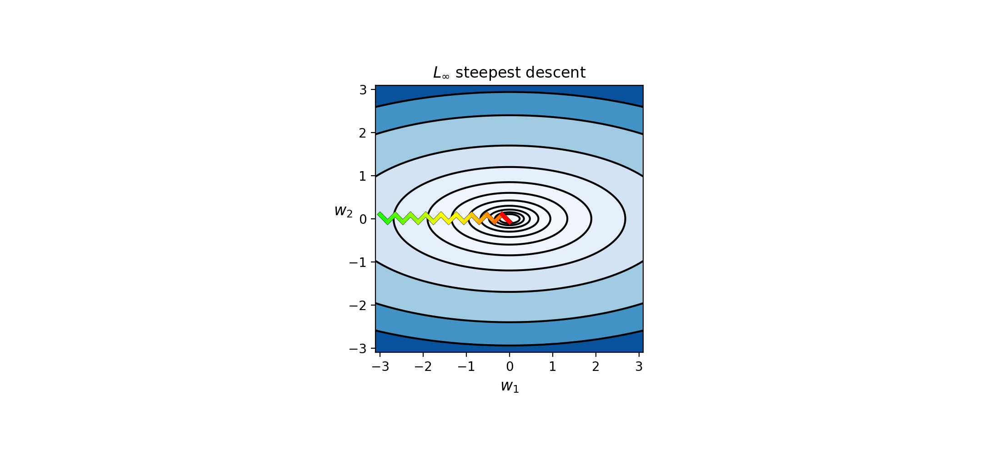

In [74]:
# define function to minimize
g = lambda w: w[0]**2 + 5*w[1]**2

# run the visualizer for our chosen input function, initial point, and step length alpha
demo = optlib.steepest_descent.visualizer();

# run
w_init = [-3,0.1]; max_its = 20; steplength = 0.25;
demo.Linf(g,w_init,steplength,max_its,num_contours = 30,linewidth = 3,xmin = -3.1, xmax = 3.1, ymin = -3.1, ymax = 3.1)

# 2.  Appendix

Here we provide formal proofs of the $L_1$ and $L_\infty$ descent directions.  Note that throughout for ease of reading we denote $\mathbf{a} = -\nabla g(\mathbf{v})$.

## 2.1  Formal derivation of $L_1$ descent direction

In what follows we find a closed form solution to

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{maximize}} & \mathbf{a}^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{1}=1\\
\end{array}
\end{equation}

written entry-wise as

\begin{equation}
\begin{array}{cc}
\underset{d_1,\,d_2,\,\ldots,\, d_n}{\text{maximize}} & a_1d_1+a_2d_2+\cdots+a_nd_n\\
\text{subject to} & \left\vert d_1\right\vert + \left\vert d_2\right\vert + \cdots + \left\vert d_n\right\vert = 1\\
\end{array}
\end{equation}

Firstly notice that if the mathematical sign of $d_i$ differs from that of $a_i$, then replacing $d_i$ with $-d_i$ would increase (or at least not decrease) the objective value without violating the equality constraint. Therefore by writing $d_i$ as

$$d_i=\text{sgn}(a_i)\,y_i$$

where $y_i$'s are now all nonnegative, our original problem can be reformulated equaivalently as 

\begin{equation}
\begin{array}{cc}
\underset{y_1,\,y_2,\,\ldots,\, y_n}{\text{maximize}} & a_1\,\text{sgn}(a_1)\,y_1+a_2\,\text{sgn}(a_2)\,y_2+\cdots+a_n\,\text{sgn}(a_n)\,y_n\\
\text{subject to} &  \left\vert \text{sgn}(a_1)\,y_1\right\vert + \left\vert \text{sgn}(a_2)\,y_2\right\vert + \cdots + \left\vert \text{sgn}(a_n)\,y_n\right\vert =1\\
& y_1, y_2, \ldots, y_n \geq 0\\
\end{array}
\end{equation}

Noticing that we have $a_i\,\text{sgn}(a_i)\,y_i=\left\vert a_i\right\vert \,y_i$ (in the objective), and $\left\vert \text{sgn}(a_i)\,y_i\right\vert = \left\vert \text{sgn}(a_i)\right\vert \left\vert y_i\right\vert = y_i$, we can rewrite the optimization problem as 

\begin{equation}
\begin{array}{cc}
\underset{y_1,\,y_2,\,\ldots,\, y_n}{\text{maximize}} & \left\vert a_1\right\vert y_1+\left\vert a_2\right\vert y_2+\cdots+\left\vert a_n\right\vert y_n\\
\text{subject to} &  y_1 +  y_2 + \cdots +  y_n =1\\
& y_1, y_2, \ldots, y_n \geq 0\\
\end{array}
\end{equation}

Finally, denoting by $j$ an index of the largest entry in $\mathbf{a}$ (in terms of magnitude)

$$j=\underset{i=1,\,2,\,\ldots,\, n}{\text{argmax}}\left|a_{i}\right|$$

we can find an upperbound to the objective

$$\left|a_{1}\right|y_{1}+\left|a_{2}\right|y_{2}+\ldots+\left|a_{n}\right|y_{n}\leq\left|a_{j}\right|y_{1}+\left|a_{j}\right|y_{2}+\ldots+\left|a_{j}\right|y_{n}=\left|a_{j}\right|$$

Notice that the $j^{th}$ standard basis vector (having one in its $j^{th}$ position and zero elsewhere) gives the same value as this upperbound, and hence $\mathbf{y}=\mathbf{e}_{j}$ is a solution to the reformulated optimization problem.  Moreover if there are several entries of $\mathbf{a}$ that are equally maximal in magnitude the above is true for each of their corresponding indices, the set of which we denote as $\mathcal{S}$.

All together then the solution to is then given as 

$$
\mathbf{d}^{\star}=\sum_{j\in \mathcal{S}}\text{sgn}(a_j)\,\mathbf{e}_{j}
$$

## 2.2  Formal derivation of $L_\infty$ descent direction

Here we find a closed form solution to

\begin{equation}
\begin{array}{cc}
\underset{\mathbf{d}}{\text{maximize}} & \mathbf{a}^{T}\mathbf{d}\\
\text{subject to} & \left\Vert \mathbf{d}\right\Vert _{\infty}=1\\
\end{array}
\end{equation}

written entry-wise as

\begin{equation}
\begin{array}{cc}
\underset{d_1,\,d_2,\,\ldots,\, d_n}{\text{maximize}} & a_1d_1+a_2d_2+\cdots+a_nd_n\\
\text{subject to} & \text{max}\left\{ \left|d_{1}\right|,\,\left|d_{2}\right|,\,\ldots,\,\left|d_{n}\right|\right\} =1\\
\end{array}
\end{equation}

Notice that the constraint set 

$$\mathcal{S}=\left\{ \mathbf{d}\left|\text{ max}\left(\left|d_{1}\right|,\,\left|d_{2}\right|,\,\ldots,\,\left|d_{n}\right|\right)=1\right.\right\}$$

is a subset of the set 

$$\mathcal{T}=\left\{ \mathbf{d}\left|\, -1\leq d_{1},\,d_{2},\,\ldots,\,d_{n}\leq1\right.\right\}$$



Therefore the maximum objective value subject to $\mathbf{d}\in\mathcal{S}$ is upperbounded by the maximum objective value subject to $\mathbf{d}\in\mathcal{T}$. The latter problem can be written as

\begin{equation}
\begin{array}{cc}
\underset{d_1,\,d_2,\,\ldots,\, d_n}{\text{maximize}} & a_1d_1+a_2d_2+\cdots+a_nd_n\\
\text{subject to} & -1\leq d_{i}\leq1,\;\forall i \\
\end{array}
\end{equation}

Now note that this problem can be broken down into $n$ independent optimization problems of the form 

\begin{equation}
\begin{array}{cc}
\underset{d_i}{\text{maximize}} & a_id_i\\
\text{subject to} & -1\leq d_{i}\leq1 \\
\end{array}
\end{equation}

with the easily calculable solution given as $d_i^{\star}=\text{sgn}(a_i)$. Taken all together

$$\mathbf{d}^{\star}=\text{sign}(\mathbf{a})$$

maximizes the objective subject to $\mathbf{d}\in\mathcal{T}$. Given we have that $\mathbf{d}^{\star}\in\mathcal{S}$ as well, $\mathbf{d}^{\star}$ also maximizes the objective subject to $\mathbf{d}\in\mathcal{S}$. 